<a href="https://colab.research.google.com/github/cchang-vassar/Semantic-Relations-in-Vector-Embeddings/blob/main/study1_5_%5Bnomic%5Dcounterevidence_pca.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [nomic] Current Embeddings of Arguments and Counterarguments

## Set Up

### Imports

In [ ]:
# General imports
import os
import zipfile
import shutil
import subprocess
import re
import pickle
import numpy as np
import pandas as pd
from enum import Enum
from typing import Optional
from ctypes import Union
from google.colab import userdata

### OSF Setup

In [ ]:
!pip install osfclient

In [ ]:
os.environ["OSF_USERNAME"] = userdata.get("OSF_USERNAME")
OSF_USERNAME = os.environ["OSF_USERNAME"]

In [ ]:
os.environ["OSF_PASSWORD"] = userdata.get("OSF_PASSWORD")
OSF_PASSWORD = os.environ["OSF_PASSWORD"]

In [ ]:
os.environ["OSF_TOKEN"] = userdata.get("OSF_TOKEN")
OSF_TOKEN = os.environ["OSF_TOKEN"]

In [ ]:
os.environ["OSF_PROJECT_ID"] = userdata.get("OSF_PROJECT_ID")
OSF_PROJECT_ID = os.environ["OSF_PROJECT_ID"]

### Nomic Setup

In [ ]:
!pip install nomic

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 896.9 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 4.5 MB/s eta 0:00:00
  Created wheel for nomic: filename=nomic-3.0.23-py3-none-any.whl size=43641 sha256=d8c4f99f39bdc2d8fffb96c80d4343ac43e39c4af5192466f448ac6a77cba978
  Stored in directory: /root/.cache/pip/wheels/89/f0/3d/71946c5a7cf58896b24ce120d99e67eac3b1f746ae5a0a9eff
Successfully built nomic


In [ ]:
!pip install sentence_transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 3.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
!pip install einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 1.5 MB/s eta 0:00:00


In [ ]:
import nomic
from sentence_transformers import SentenceTransformer

### Class Declarations

In [ ]:
# Enum for processing unit
class ProcessingUnit(Enum):
  GLOBAL = "global"
  CATEGORY = "category"
  DEBATE = "debate"

## Get Embeddings

### [Imports] Get Embeddings

In [ ]:
!pip install tenacity

In [ ]:
import time
from tenacity import (
  retry,
  stop_after_attempt,
  wait_random_exponential
)

### [OSF-Import] Import embeddings dump from OSF

In [ ]:
def import_embeddings_dump():
  """Import embeddings_dump from OSF"""
  subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/nomic-autoencoder/nomic_evidence_embeddings_dump.zip", shell=True)
  print("nomic_evidence_embeddings_dump.zip successfully imported")

  embeddings_dump_file_path_zip = 'nomic_evidence_embeddings_dump.zip'
  embeddings_dump_file_path = 'current-data-dump/embeddings-dump'
  os.makedirs(embeddings_dump_file_path, exist_ok=True)
  with zipfile.ZipFile(embeddings_dump_file_path_zip, 'r') as zip_ref:
    zip_ref.extractall(embeddings_dump_file_path)

  extracted_files = os.listdir(embeddings_dump_file_path)
  print("Files extracted:", extracted_files)

### [All] Embeddings df

### Generate Nomic Embeddings

In [ ]:
DIM_EMBEDDING = 768
model = SentenceTransformer("nomic-ai/nomic-embed-text-v1.5", trust_remote_code=True)

def _get_embeddings(arguments_df: pd.DataFrame, file_name: str = 'global') -> pd.DataFrame:
  arguments_list = list(arguments_df['argument'])

  search_document_embeddings = model.encode(['search_document: ' + argument for argument in arguments_list])
  search_document_df = pd.DataFrame(search_document_embeddings, columns=[f"search_document_{str(i)}" for i in range(DIM_EMBEDDING)])
  embeddings_sd_df = pd.concat([arguments_df, search_document_df], axis=1)

  output_folder = f'current-data-dump/embeddings-dump/'
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)
  sd_output_file_path = f'{output_folder}{file_name}_embeddings.pkl'

  embeddings_sd_df.to_pickle(sd_output_file_path)

  return {
    "embeddings_sd_df": embeddings_sd_df
  }

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/255 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/140 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/69.0k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/120 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.57k [00:00<?, ?B/s]

configuration_hf_nomic_bert.py:   0%|          | 0.00/1.96k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/nomic-ai/nomic-embed-text-v1-unsupervised:
- configuration_hf_nomic_bert.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_hf_nomic_bert.py:   0%|          | 0.00/52.6k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/nomic-ai/nomic-embed-text-v1-unsupervised:
- modeling_hf_nomic_bert.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.safetensors:   0%|          | 0.00/547M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/695 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/286 [00:00<?, ?B/s]

### [OSF-Export] Export embeddings dump to OSF

In [ ]:
def export_embeddings_dump():
  """Export embeddings_dump to OSF"""
  embeddings_dump_file_path = 'current-data-dump/embeddings-dump'
  embeddings_dump_file_path_zip = 'current-data-dump/embeddings-dump'
  shutil.make_archive(embeddings_dump_file_path_zip, 'zip', embeddings_dump_file_path)
  print(f"Zip file created at: {embeddings_dump_file_path_zip}")
  result = subprocess.run([f"osf -p sakjg upload --force {embeddings_dump_file_path_zip}.zip data-dump/nomic-autoencoder/nomic_evidence_embeddings_dump.zip"], shell=True, capture_output=True, text=True)
  print(result.stderr)
  print(f"File: {embeddings_dump_file_path_zip} uploaded at osfstorage")

## Analyze Embeddings

### [Imports] Analysis df

In [ ]:
import joblib
from sklearn.decomposition import PCA

### [OSF-Import] Import pca dump from OSF

In [ ]:
def import_pca_dump():
  """Import pca_dump from OSF"""
  subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/nomic-autoencoder/nomic_evidence_pca_dump.zip", shell=True)
  print("nomic_evidence_pca_dump.zip successfully imported")

  pca_dump_file_path_zip = 'nomic_evidence_pca_dump.zip'
  pca_dump_file_path = 'current-data-dump/pca-dump'
  with zipfile.ZipFile(pca_dump_file_path_zip, 'r') as zip_ref:
    zip_ref.extractall(pca_dump_file_path)

  extracted_files = os.listdir(pca_dump_file_path)
  print("Files extracted:", extracted_files)

### [Write] Analysis df

In [ ]:
def _analysis_write_to_file(
  analysis_df: pd.DataFrame,
  pca: PCA,
  file_name: str,
  ):
  """Write analysis results to pickle file"""
  folder_path = f'current-data-dump/pca-dump/'
  file_path = f'{folder_path}{file_name}.pkl'
  pca_file_path = f'{folder_path}{file_name}_obj.pkl'
  if not os.path.exists(folder_path):
    os.makedirs(folder_path)

  with open(file_path, 'wb') as file:
    pickle.dump(analysis_df, file)
    print(f"File uploaded to {file_path}")
  joblib.dump(pca, pca_file_path)
  print(f"PCA object file uploaded to {pca_file_path}")

### [Debate] Analysis df

In [ ]:
def pca_normalization(argument_embeddings_df: pd.DataFrame, evidence_embeddings_df: pd.DataFrame) -> pd.DataFrame: # side effect function
  """Normalize PCA argument embeddings from a df"""
  arguments = argument_embeddings_df["argument"].copy()
  evidences = evidence_embeddings_df["evidence"].copy()
  argument_embeddings_df.drop(['argument'], axis=1, inplace=True)
  evidence_embeddings_df.drop(['evidence'], axis=1, inplace=True)

  mean_vecs = (argument_embeddings_df + evidence_embeddings_df) / 2

  argument_embeddings_df = argument_embeddings_df.subtract(mean_vecs)
  evidence_embeddings_df = evidence_embeddings_df.subtract(mean_vecs)

  argument_embeddings_df["text"] = arguments
  argument_embeddings_df["argument_evidence"] = "argument"
  evidence_embeddings_df["text"] = evidences
  evidence_embeddings_df["argument_evidence"] = "evidence"
  return (argument_embeddings_df, evidence_embeddings_df)

In [ ]:
def pca_embeddings(
    num_components: int,
    argument_embeddings_df: pd.DataFrame,
    evidence_embeddings_df: pd.DataFrame,
    file_name: str
  ):
  normalized_embeddings_df = pca_normalization(argument_embeddings_df.copy(), evidence_embeddings_df.copy())
  argument_embeddings_normalized = normalized_embeddings_df[0]
  evidence_embeddings_normalized = normalized_embeddings_df[1]
  interleaved_df = pd.concat([argument_embeddings_normalized, evidence_embeddings_normalized], keys=[0, 1])
  interleaved_df = interleaved_df.sort_index(level=[1, 0])
  interleaved_df.reset_index(drop=True, inplace=True)
  interleaved_text = interleaved_df["text"]
  interleaved_type = interleaved_df["argument_evidence"]
  interleaved_df.drop(["text", "argument_evidence"], axis=1, inplace=True)

  num_components = min(num_components, interleaved_df.shape[0], interleaved_df.shape[1])
  pca = PCA(n_components=num_components)
  embeddings_pca = pca.fit_transform(interleaved_df)
  embeddings_pca_data = pd.DataFrame(embeddings_pca, columns=['pca_{}'.format(i) for i in range(num_components)])
  embeddings_pca_data["text"] = interleaved_text
  last_elem = interleaved_text.iloc[-1]
  interleaved_text = interleaved_text.shift(1)
  interleaved_text.iloc[0] = last_elem
  embeddings_pca_data["argument"] = interleaved_text
  embeddings_pca_data["argument_evidence"] = interleaved_type
  embeddings_pca_data["pair_id"] = embeddings_pca_data.index // 2

  # Printing PCA attributes
  components = pca.components_
  explained_variance = pca.explained_variance_
  explained_variance_ratio = pca.explained_variance_ratio_
  singular_values = pca.singular_values_
  mean_value = pca.mean_
  n_components = pca.n_components_
  n_features = pca.n_features_in_
  n_samples = pca.n_samples_

  # Displaying the attributes
  print("Components:")
  print(components)
  print("\nExplained Variance:")
  print(explained_variance)
  print("\nExplained Variance Ratio:")
  print(explained_variance_ratio)
  print("\nSingular Values:")
  print(singular_values)
  print("\nMean:")
  print(mean_value)
  print("\nNumber of Components:")
  print(n_components)
  print("\nNumber of Features:")
  print(n_features)
  print("\nNumber of Samples:")
  print(n_samples)

  # Write to file
  _analysis_write_to_file(embeddings_pca_data, pca, file_name)
  return embeddings_pca_data

### [Global] Analysis df

In [ ]:
def global_analyze_embeddings(
  num_components: int,
  argument_embeddings_df: pd.DataFrame,
  evidence_embeddings_df: pd.DataFrame,
  file_name: str
  ):
  """Analyze argument embeddings from a global df"""
  global_embeddings_analysis = pca_embeddings(num_components, argument_embeddings_df, evidence_embeddings_df, file_name)

  # Write to file for facet
  output_folder = f'current-data-dump/pca-dump/'
  output_file_path = f'{output_folder}{file_name}.pkl'
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)
  global_embeddings_analysis.to_pickle(output_file_path)
  return global_embeddings_analysis

### [OSF-Export] Export pca dump to OSF

In [ ]:
def export_pca_dump():
  """Export pca_dump to OSF"""
  pca_dump_file_path = 'current-data-dump/pca-dump'
  pca_dump_file_path_zip = 'current-data-dump/pca-dump'
  shutil.make_archive(pca_dump_file_path_zip, 'zip', pca_dump_file_path)
  print(f"Zip file created at: {pca_dump_file_path_zip}")
  result = subprocess.run([f"osf -p sakjg upload --force {pca_dump_file_path_zip}.zip data-dump/nomic-autoencoder/nomic_evidence_pca_dump.zip"], shell=True, capture_output=True, text=True)
  print(result.stderr)
  print(f"File: {pca_dump_file_path_zip} uploaded at osfstorage")

## Plot Embeddings

### [Imports] Analysis Plot

In [ ]:
from plotnine import ggplot, geom_point, geom_text, geom_bar, geom_line, geom_histogram, scale_x_continuous, aes, theme, theme_void, labs, element_text, facet_wrap, ggsave, scale_x_continuous, scale_y_continuous

### [OSF-Import] Import plots dump from OSF

In [ ]:
def import_pca_plots_dump():
  """Import pca_plots_dump from OSF"""
  subprocess.run("osf -p sakjg fetch --force osfstorage/data-dump/nomic-autoencoder/nomic_evidence_pca_plots_dump.zip", shell=True)
  print("nomic_evidence_pca_plots_dump.zip successfully imported")

  pca_plots_dump_file_path_zip = 'nomic_evidence_pca_plots_dump.zip'
  pca_plots_dump_file_path = 'current-data-dump/pca-plots-dump'
  with zipfile.ZipFile(pca_plots_dump_file_path_zip, 'r') as zip_ref:
    zip_ref.extractall(pca_plots_dump_file_path)

  extracted_files = os.listdir(pca_plots_dump_file_path)
  print("Files extracted:", extracted_files)

### [Global] Analysis Plot

In [ ]:
def _insert_line_breaks(text, max_width=50):
  """Insert line breaks in text"""
  words = text.split(' ')
  lines = []
  current_line = ''

  for word in words:
    if len(current_line) + len(word) <= max_width:
      current_line += word + ' '
    else:
      lines.append(current_line.strip())
      current_line = word + ' '

  lines.append(current_line.strip())
  return '\n'.join(lines)

In [ ]:
def global_plot(
  global_plot_data: pd.DataFrame,
  file_name: str
  ):
  """Plot embeddings for all debates"""

  # Plot
  plot_title=f'PCA Plot for All Argument-Evidence Pairs from IBM-EMNLP {"(Shuffled)" if not file_name == "global_pca" else ""}'
  mask = (global_plot_data['text'] == 'We should ban partial birth abortions') | (global_plot_data['argument'] == 'We should ban partial birth abortions')
  filtered_data = global_plot_data[mask]
  gg = (
    ggplot(global_plot_data, aes(x='pca_0', y='pca_1', group='pair_id')) +
    geom_line(color='black', size=0.2, alpha=0.8) +
    geom_line(color='red', size=1, data=filtered_data) +
    geom_point(color='red', size=4, data=global_plot_data[global_plot_data['argument_evidence'] == 'argument'][global_plot_data['text'] == 'We should ban partial birth abortions']) +
    geom_point(color='red', size=4, data=global_plot_data[global_plot_data['argument_evidence'] == 'evidence'][global_plot_data['argument'] == 'We should ban partial birth abortions'], shape=9) +
    scale_x_continuous(limits = [-6, 6]) +
    scale_y_continuous(limits = [-6, 6]) +
    labs(
      title=plot_title,
      x=f'PCA_0',
      y=f'PCA_1'
    ) +
    theme(
      legend_position="none",
      plot_title=element_text(size=40, wrap=True),
      strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
      axis_text=element_text(size=24),
      axis_title=element_text(size=32),
      figure_size=(16, 16)
    )
  )

  # Save to file
  output_folder = f'current-data-dump/pca-plots-dump/'
  output_file_path = f'{output_folder}{file_name}_plot.png'
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)
  ggsave(gg, output_file_path)
  print(gg)

### [Export] Export plots dump to OSF

In [ ]:
def export_pca_plots_dump():
  """Export pca_plots_dump to OSF"""
  pca_plots_dump_file_path = 'current-data-dump/pca-plots-dump'
  pca_plots_dump_file_path_zip = 'current-data-dump/pca-plots-dump'
  shutil.make_archive(pca_plots_dump_file_path_zip, 'zip', pca_plots_dump_file_path)
  print(f"Zip file created at: {pca_plots_dump_file_path_zip}")
  result = subprocess.run([f"osf -p sakjg upload --force {pca_plots_dump_file_path_zip}.zip data-dump/nomic-autoencoder/nomic_evidence_pca_plots_dump.zip"], shell=True, capture_output=True, text=True)
  print(result.stderr)
  print(f"File: {pca_plots_dump_file_path_zip} uploaded at osfstorage")

## Run

### [Run] Import Arguments-Counterevidence df from OSF

In [ ]:
!osf -p sakjg fetch --force osfstorage/corpora/ibm_evidence_corpus.zip
print("ibm_evidence_corpus.zip successfully imported")

evidence_corpus_file_path_zip = 'ibm_evidence_corpus.zip'
evidence_corpus_file_path = 'current-data-dump/evidence_corpus'
with zipfile.ZipFile(evidence_corpus_file_path_zip, 'r') as zip_ref:
  zip_ref.extractall(evidence_corpus_file_path)

extracted_files = os.listdir(evidence_corpus_file_path)
print("Files extracted:", extracted_files)

100% 600k/600k [00:00<00:00, 132Mbytes/s]
ibm_evidence_corpus.zip successfully imported
Files extracted: ['__MACOSX', 'ibm_evidence_corpus']


In [ ]:
corpus_data_path = "current-data-dump/evidence_corpus/ibm_evidence_corpus/"
loaded_global_corpus_df = pd.read_csv(f"{corpus_data_path}train.csv")
loaded_global_corpus_df = loaded_global_corpus_df.loc[loaded_global_corpus_df['label'] == 1]
loaded_global_corpus_df = loaded_global_corpus_df.drop(['the concept of the topic', 'candidate masked', 'wikipedia article name', 'wikipedia url', 'label'], axis=1)

In [ ]:
corpus_data_path = "current-data-dump/evidence_corpus/ibm_evidence_corpus/"
test_loaded_global_corpus_df = pd.read_csv(f"{corpus_data_path}test.csv")
test_loaded_global_corpus_df = test_loaded_global_corpus_df.loc[test_loaded_global_corpus_df['label'] == 1]
test_loaded_global_corpus_df = test_loaded_global_corpus_df.drop(['the concept of the topic', 'candidate masked', 'wikipedia article name', 'wikipedia url', 'label'], axis=1)

In [ ]:
combined_df = pd.concat([loaded_global_corpus_df, test_loaded_global_corpus_df], axis=0)
combined_df = combined_df.reset_index(drop=True)

### [Run] Get Embeddings

In [ ]:
# Run global level get embeddings
global_argument_embeddings = combined_df.copy().drop(columns=['candidate'])
global_evidence_embeddings = combined_df.copy().drop(columns=['topic'])
global_argument_embeddings = global_argument_embeddings.rename(columns={'topic': 'argument'})
global_evidence_embeddings = global_evidence_embeddings.rename(columns={'candidate': 'argument'})

global_argument_embeddings = _get_embeddings(global_argument_embeddings, file_name='argument')["embeddings_sd_df"]
global_evidence_embeddings = _get_embeddings(global_evidence_embeddings, file_name='evidence')["embeddings_sd_df"]

### [Run] Export Embeddings Dump to OSF

In [ ]:
export_embeddings_dump()

Zip file created at: current-data-dump/embeddings-dump

File: current-data-dump/embeddings-dump uploaded at osfstorage


### [Run] Import Embeddings Dump from OSF

In [ ]:
import_embeddings_dump()

nomic_evidence_embeddings_dump.zip successfully imported
Files extracted: ['global_sd_embeddings.pkl']


In [ ]:
embeddings_data_path = "current-data-dump/embeddings-dump/"
loaded_global_argument_embeddings_df = pd.read_pickle(f"{embeddings_data_path}argument_embeddings.pkl")
loaded_global_evidence_embeddings_df = pd.read_pickle(f"{embeddings_data_path}evidence_embeddings.pkl")

In [ ]:
loaded_global_evidence_embeddings_df = loaded_global_evidence_embeddings_df.rename(columns={'argument': 'evidence'})

### [Run]  Analyze Embeddings

In [ ]:
# Run global level global facet pca embeddings
global_pca = global_analyze_embeddings(10, loaded_global_argument_embeddings_df, loaded_global_evidence_embeddings_df, "global_pca")

Components:
[[ 0.00647226 -0.01192774  0.11044068 ...  0.00267926 -0.04309779
  -0.09334017]
 [-0.03488582 -0.01369717 -0.03988716 ...  0.0527488  -0.004441
  -0.00829814]
 [ 0.0528535  -0.0445199   0.01568635 ... -0.01376641  0.00027411
  -0.00303074]
 ...
 [-0.09093726  0.08105008  0.02431403 ...  0.06541982 -0.08641134
  -0.01122138]
 [ 0.00640793 -0.03348104  0.03109189 ... -0.02774133 -0.01788289
   0.0929064 ]
 [-0.00424147  0.03492376  0.02616099 ...  0.01649363  0.02120918
  -0.03318978]]

Explained Variance:
[16.796396    2.972958    1.9574695   1.6419449   1.4590929   1.220993
  1.1956567   1.0229179   0.9495693   0.87463963]

Explained Variance Ratio:
[0.26213005 0.04639696 0.03054891 0.02562473 0.02277108 0.01905522
 0.01865981 0.01596399 0.01481929 0.01364991]

Singular Values:
[270.70773  113.890366  92.4145    84.63927   79.78735   72.98762
  72.22638   66.80562   64.36591   61.774208]

Mean:
[-1.39997167e-10  1.50240861e-10  5.46330377e-11 -1.43411727e-10
  1.17119581e-

In [ ]:
loaded_global_argument_embeddings_shuffled_df = loaded_global_argument_embeddings_df.copy()
shuffled_indices = np.random.permutation(loaded_global_argument_embeddings_shuffled_df.index)
loaded_global_argument_embeddings_shuffled_df = loaded_global_argument_embeddings_shuffled_df.reindex(shuffled_indices).reset_index(drop=True)

In [ ]:
# Run global level global facet pca embeddings (shuffled)
global_shuffled_pca = global_analyze_embeddings(10, loaded_global_argument_embeddings_shuffled_df, loaded_global_evidence_embeddings_df, "global_shuffled_pca")

Components:
[[ 0.00873183 -0.01340616  0.11232386 ...  0.00137175 -0.04338452
  -0.09307612]
 [-0.04060072  0.01935375 -0.06317062 ...  0.05863261 -0.01620399
  -0.02503187]
 [-0.12767965  0.00221242 -0.00928889 ...  0.03078824 -0.01389419
   0.01405919]
 ...
 [ 0.00047169 -0.02468038  0.04645946 ... -0.00187933  0.00996768
  -0.04341238]
 [ 0.05432454  0.06350613  0.00236197 ... -0.07157497 -0.01589395
  -0.03123618]
 [-0.03673835  0.0523902  -0.0456507  ...  0.03433831 -0.05989358
   0.01711429]]

Explained Variance:
[16.888414   6.32121    3.1860046  2.7521732  2.243638   2.1111197
  2.0009477  1.869028   1.7243066  1.6881458]

Explained Variance Ratio:
[0.17310864 0.0647933  0.032657   0.02821016 0.02299761 0.02163928
 0.02051    0.0191578  0.01767439 0.01730373]

Singular Values:
[271.44824  166.07059  117.90054  109.579796  98.93934   95.97299
  93.43519   90.30265   86.73609   85.82179 ]

Mean:
[ 5.39501277e-10  9.01445141e-10  4.09747791e-10  3.41456485e-12
  4.57551691e-10 -5.

In [ ]:
# only one evidence for each argument
sample_loaded_global_argument_embeddings_df = loaded_global_argument_embeddings_df.copy().groupby('argument').sample(n=1)
sample_loaded_global_evidence_embeddings_df = loaded_global_evidence_embeddings_df.copy().iloc[sample_loaded_global_argument_embeddings_df.index]

In [ ]:
# Run global level global facet pca embeddings (shuffled) + (sample)
sample_global_shuffled_pca = global_analyze_embeddings(10, sample_loaded_global_argument_embeddings_df, sample_loaded_global_evidence_embeddings_df, "global_sample_shuffled_pca")

KeyError: 'evidence'

### [Run] Export PCA Dump to OSF

In [ ]:
# Export pca_df to OSF
export_pca_dump()

Zip file created at: current-data-dump/pca-dump

File: current-data-dump/pca-dump uploaded at osfstorage


### [Run] Import PCA Dump from OSF

In [ ]:
import_pca_dump()

nomic_evidence_pca_dump.zip successfully imported
Files extracted: ['global_pca_obj.pkl', 'global_shuffled_pca.pkl', 'global_shuffled_pca_obj.pkl', 'global_bad_pca_obj.pkl', 'global_bad_pca.pkl', '.ipynb_checkpoints', 'global_pca.pkl']


In [ ]:
pca_data_path = "current-data-dump/pca-dump/"
loaded_global_pca_df = pd.read_pickle(f"{pca_data_path}global_pca.pkl")
loaded_global_shuffled_pca_df = pd.read_pickle(f"{pca_data_path}global_shuffled_pca.pkl")

<ipython-input-15-41dcdfbeff4d>:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
<ipython-input-15-41dcdfbeff4d>:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/global_pca_plot.png


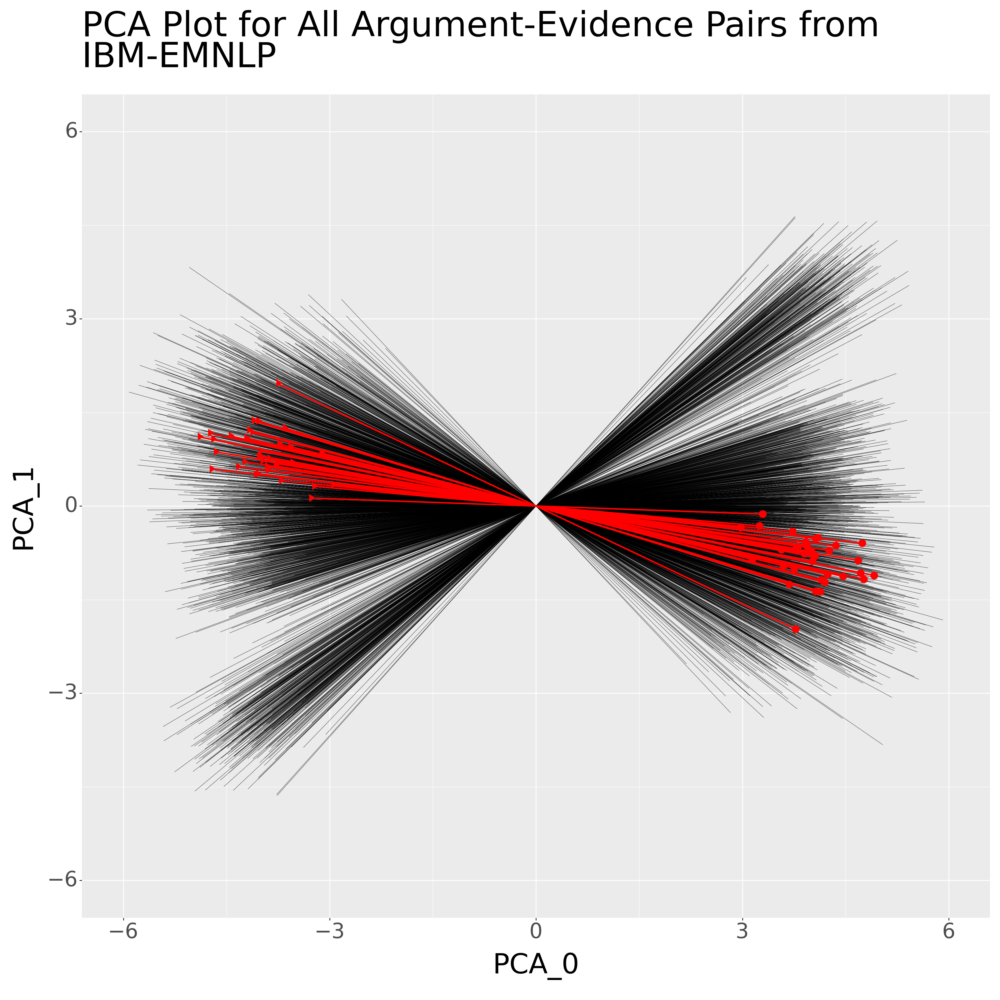

In [ ]:
# Run global level global view pca plot
global_plot(loaded_global_pca_df, "global_pca")

<ipython-input-15-41dcdfbeff4d>:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
<ipython-input-15-41dcdfbeff4d>:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/global_shuffled_pca_plot.png


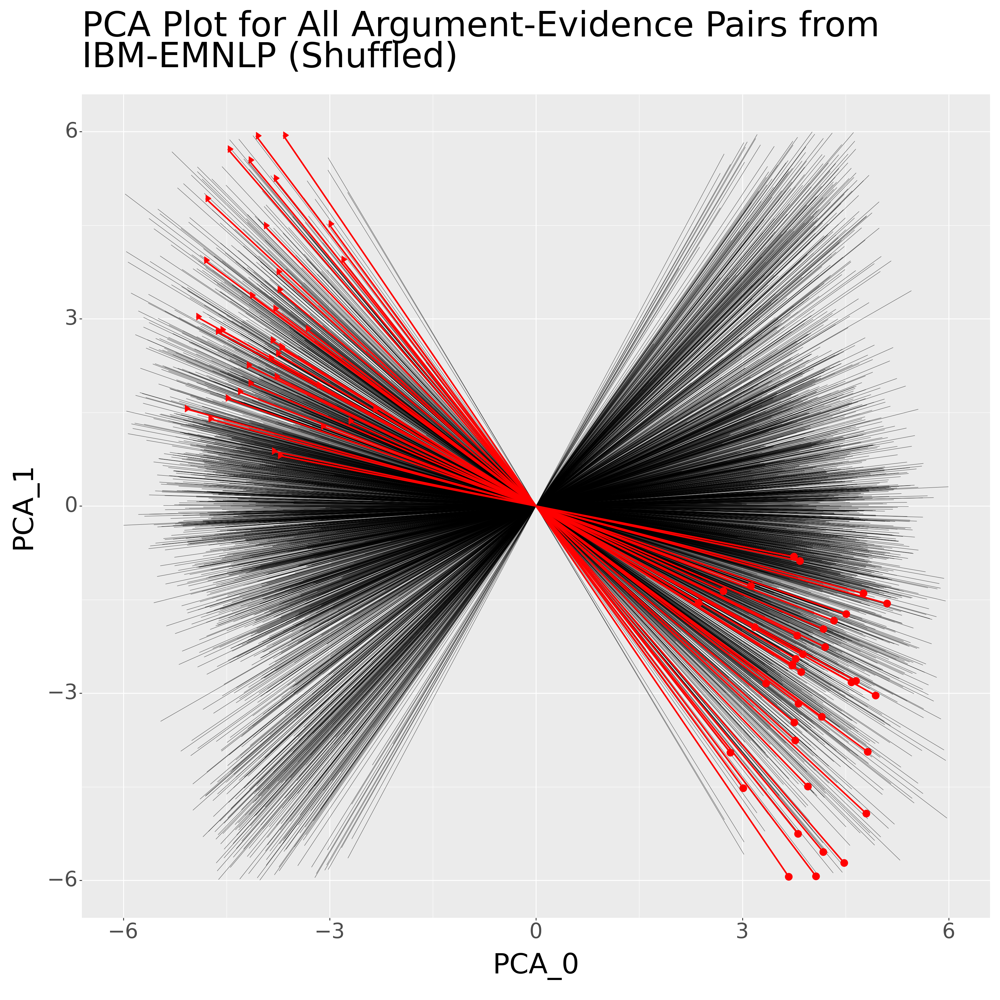

In [ ]:
# Run global level global view pca plot
global_plot(loaded_global_shuffled_pca_df, "global_shuffled_pca")

In [ ]:
# Run global level global view pca plot (sample)
global_plot(sample_global_shuffled_pca, "global_sample_pca")

NameError: name 'sample_global_shuffled_pca' is not defined

### [Run] Global PCA Components Plot

In [ ]:
loaded_global_pca_obj = joblib.load("current-data-dump/pca-dump/global_pca_obj.pkl")
global_pca_obj = loaded_global_pca_obj.explained_variance_ratio_
global_pca_obj_df = pd.DataFrame({'pca_explained_ratio': global_pca_obj})
global_pca_obj_df['pca_num'] = global_pca_obj_df.index + 1
global_pca_obj_plot = (
    ggplot(global_pca_obj_df, aes(x='pca_num', y='pca_explained_ratio')) +
    geom_bar(stat="identity") +
    labs(
        title=f'Ratio of Explained Variance for Principal Components 1 to 10'
        ) +
    theme(
        axis_title=element_text(size=32),
        axis_text=element_text(size=24),
        plot_title=element_text(size=40, wrap=True, lineheight=1.5),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        figure_size=(16, 16)
    ) +
    scale_x_continuous(breaks=list(range(int(global_pca_obj_df['pca_num'].min()), int(global_pca_obj_df['pca_num'].max()) + 1)))
)
ggsave(global_pca_obj_plot, "current-data-dump/pca-plots-dump/global_pca_components_plot.png")

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/global_pca_components_plot.png


In [ ]:
loaded_global_shuffled_pca_obj = joblib.load("current-data-dump/pca-dump/global_shuffled_pca_obj.pkl")
global_shuffled_pca_obj = loaded_global_shuffled_pca_obj.explained_variance_ratio_
global_shuffled_pca_obj_df = pd.DataFrame({'pca_explained_ratio': global_shuffled_pca_obj})
global_shuffled_pca_obj_df['pca_num'] = global_shuffled_pca_obj_df.index + 1
global_shuffled_pca_obj_plot = (
    ggplot(global_shuffled_pca_obj_df, aes(x='pca_num', y='pca_explained_ratio')) +
    geom_bar(stat="identity") +
    labs(
        title=f'Ratio of Explained Variance for Principal Components 1 to 10 (shuffled)'
        ) +
    theme(
        axis_title=element_text(size=32),
        axis_text=element_text(size=24),
        plot_title=element_text(size=40, wrap=True, lineheight=1.5),
        strip_text=element_text(angle=0, hjust=0.5, vjust=1, wrap=True),
        figure_size=(16, 16)
    ) +
    scale_x_continuous(breaks=list(range(int(global_shuffled_pca_obj_df['pca_num'].min()), int(global_shuffled_pca_obj_df['pca_num'].max()) + 1)))
)
ggsave(global_shuffled_pca_obj_plot, "current-data-dump/pca-plots-dump/global_shuffled_pca_components_plot.png")

/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:587: PlotnineWarning: Saving 16 x 16 in image.
/usr/local/lib/python3.10/dist-packages/plotnine/ggplot.py:588: PlotnineWarning: Filename: current-data-dump/pca-plots-dump/global_shuffled_pca_components_plot.png


### [Run] Export PCA Plots Dump to OSF

In [ ]:
export_pca_plots_dump()

Zip file created at: current-data-dump/pca-plots-dump

File: current-data-dump/pca-plots-dump uploaded at osfstorage


### [Run] Import PCA Plots Dump from OSF

In [ ]:
import_pca_plots_dump()

nomic_evidence_pca_plots_dump.zip successfully imported


FileNotFoundError: [Errno 2] No such file or directory: 'nomic_evidence_pca_plots_dump.zip'